In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import random
import numpy as np
import warnings
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy import stats
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler,MinMaxScaler
from sklearn.preprocessing import FunctionTransformer, power_transform,PowerTransformer
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, accuracy_score
from catboost import CatBoostClassifier,CatBoostRegressor
from imblearn.pipeline import make_pipeline as make_imb_pipeline
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE,BorderlineSMOTE
from sklearn.neural_network import MLPClassifier
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from sklearn.svm import SVC
warnings.filterwarnings("ignore")

In [5]:
#https://drive.google.com/file/d/1kw_C6kFF1XPNzREqdbREGGZIpdQN6OPy/view?usp=sharing
!gdown --id 1kw_C6kFF1XPNzREqdbREGGZIpdQN6OPy

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1kw_C6kFF1XPNzREqdbREGGZIpdQN6OPy
To: /content/churn_rate_prediction.csv
100% 8.71M/8.71M [00:00<00:00, 36.3MB/s]


# 1. Load Data

In [6]:
df=pd.read_csv("churn_rate_prediction.csv")
df.head()

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.63,53005.25,17.0,781.75,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,...,306.34,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.16,21027.00,22.0,500.69,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.27,25239.56,6.0,567.66,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.13,24483.66,16.0,663.06,No,Yes,Yes,Solved,Poor Website,5


# Khám phá Dữ liệu (Data Exploration)

In [ ]:
#thông tin các features
print(df.columns)

Index(['customer_id', 'Name', 'age', 'gender', 'security_no',
       'region_category', 'membership_category', 'joining_date',
       'joined_through_referral', 'referral_id', 'preferred_offer_types',
       'medium_of_operation', 'internet_option', 'last_visit_time',
       'days_since_last_login', 'avg_time_spent', 'avg_transaction_value',
       'avg_frequency_login_days', 'points_in_wallet', 'used_special_discount',
       'offer_application_preference', 'past_complaint', 'complaint_status',
       'feedback', 'churn_risk_score'],
      dtype='object')


<AxesSubplot: >

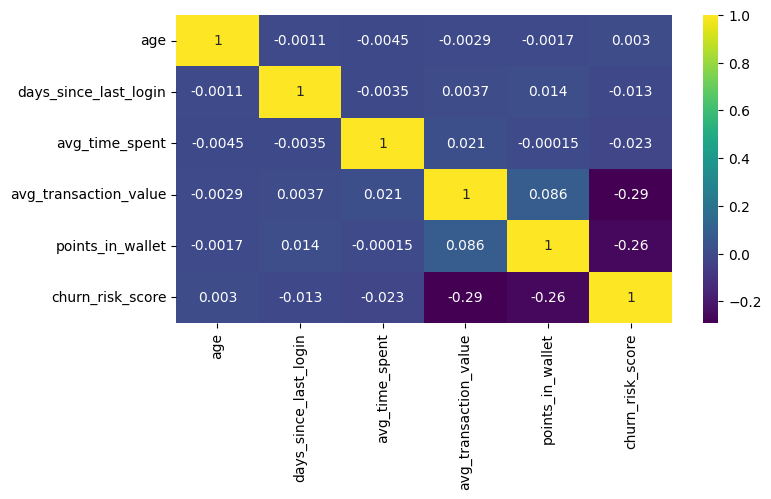

In [ ]:
plt.figure(figsize=(8,4))
sns.heatmap(df.corr(),annot = True, cmap ='viridis')

In [ ]:
'''
customer_id: Mã định danh
Name: Tên khách hàng.
age: Tuổi khách hàng.
gender: Giới tính khách hàng.
security_no: Số bảo mật khách hàng.
region_category: Phân loại khu vực/địa điểm.
membership_category: Loại hình hội viên.
joining_date: Ngày tham gia .
joined_through_referral: Cách khách hàng tham gia dịch vụ.
referral_id: Mã số định danh của người đã giới thiệu nếu có.
preferred_offer_types: Các loại ưu đãi ưa thích của khách hàng.
medium_of_operation: Phương tiện truy cập dịch vụ.
internet_option: Chọn kết nối internet.
last_visit_time: Thời gian thăm gần nhất .
days_since_last_login: Số ngày kể từ lần đăng nhập cuối cùng.
avg_time_spent: Thời gian trung bình mà khách hàng tiêu trong việc sử dụng dịch vụ.
avg_transaction_value: Giá trị giao dịch trung bình của khách hàng.
avg_frequency_login_days: Số ngày trung bình giữa các lần đăng nhập.
points_in_wallet: Điểm tích luỹ trong tài khoản của khách hàng.
used_special_discount: Khách hàng đã sử dụng ưu đãi đặc biệt hay không.
offer_application_preference: Sự ưa thích về ứng dụng ưu đãi.
past_complaint: Khách hàng đã có khiếu nại trong quá khứ hay không.
complaint_status: Trạng thái khiếu nại gần nhất của khách hàng.
feedback: Phản hồi của khách hàng về dịch vụ.
churn_risk_score: Điểm nguy cơ chuyển đổi của khách hàng (có thể liên quan đến việc họ dừng sử dụng dịch vụ).
'''

'\ncustomer_id: Mã định danh \nName: Tên khách hàng.\nage: Tuổi khách hàng.\ngender: Giới tính khách hàng.\nsecurity_no: Số bảo mật khách hàng.\nregion_category: Phân loại khu vực/địa điểm.\nmembership_category: Loại hình hội viên.\njoining_date: Ngày tham gia .\njoined_through_referral: Cách khách hàng tham gia dịch vụ.\nreferral_id: Mã số định danh của người đã giới thiệu nếu có.\npreferred_offer_types: Các loại ưu đãi ưa thích của khách hàng.\nmedium_of_operation: Phương tiện truy cập dịch vụ.\ninternet_option: Chọn kết nối internet.\nlast_visit_time: Thời gian thăm gần nhất .\ndays_since_last_login: Số ngày kể từ lần đăng nhập cuối cùng.\navg_time_spent: Thời gian trung bình mà khách hàng tiêu trong việc sử dụng dịch vụ.\navg_transaction_value: Giá trị giao dịch trung bình của khách hàng.\navg_frequency_login_days: Số ngày trung bình giữa các lần đăng nhập.\npoints_in_wallet: Điểm tích luỹ trong tài khoản của khách hàng.\nused_special_discount: Khách hàng đã sử dụng ưu đãi đặc biệt

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28783 entries, 0 to 28782
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   customer_id                   28783 non-null  object 
 1   Name                          28783 non-null  object 
 2   age                           28783 non-null  int64  
 3   gender                        28783 non-null  object 
 4   security_no                   28783 non-null  object 
 5   region_category               24519 non-null  object 
 6   membership_category           28783 non-null  object 
 7   joining_date                  28783 non-null  object 
 8   joined_through_referral       28783 non-null  object 
 9   referral_id                   28783 non-null  object 
 10  preferred_offer_types         28559 non-null  object 
 11  medium_of_operation           28783 non-null  object 
 12  internet_option               28783 non-null  object 
 13  l

In [ ]:
df.describe()

,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn_risk_score
count,28783.000000,28783.000000,28783.000000,28783.000000,26102.000000,28782.000000
mean,37.168224,-41.908244,244.966233,29285.334940,686.793893,3.462233
std,15.888318,228.791623,402.153485,19505.140849,194.632902,1.415152
min,10.000000,-999.000000,-2814.109110,806.220000,-760.661236,-1.000000
25%,23.000000,8.000000,60.615000,14269.110000,616.265000,3.000000
50%,37.000000,12.000000,162.640000,27524.270000,698.025000,4.000000
75%,51.000000,16.000000,358.340000,40777.715000,764.260000,5.000000
max,64.000000,26.000000,3040.410000,99861.470000,1816.933696,5.000000


Cần sử lý lại dữ liệu và tìm hiểu về các giá trị số âm

In [ ]:
#Kiểm tra missing values
df.isnull().sum()

customer_id                        0
Name                               0
age                                0
gender                             0
security_no                        0
region_category                 4264
membership_category                0
joining_date                       0
joined_through_referral            0
referral_id                        0
preferred_offer_types            224
medium_of_operation                0
internet_option                    0
last_visit_time                    0
days_since_last_login              0
avg_time_spent                     0
avg_transaction_value              0
avg_frequency_login_days           0
points_in_wallet                2681
used_special_discount              0
offer_application_preference       0
past_complaint                     0
complaint_status                   0
feedback                           1
churn_risk_score                   1
dtype: int64

In [ ]:
max_length = max(len(col) for col in df.columns)
for col in df.columns:
    spaces = " " * (max_length - len(col) + 2)
    print('{}  {}{}'.format(col, spaces, df[col].nunique()))


customer_id                     28783
Name                            28783
age                             55
gender                          3
security_no                     28783
region_category                 3
membership_category             6
joining_date                    1096
joined_through_referral         3
referral_id                     9695
preferred_offer_types           3
medium_of_operation             4
internet_option                 3
last_visit_time                 24476
days_since_last_login           27
avg_time_spent                  21303
avg_transaction_value           28723
avg_frequency_login_days        1287
points_in_wallet                19711
used_special_discount           2
offer_application_preference    2
past_complaint                  2
complaint_status                6
feedback                        9
churn_risk_score                6


In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot: xlabel='count', ylabel='churn_risk_score'>

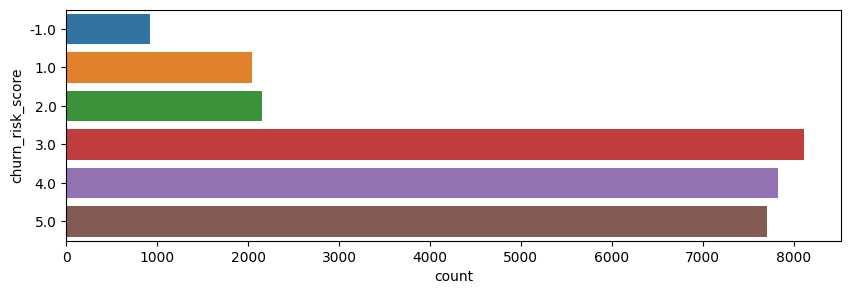

In [ ]:
### Target column
plt.figure(figsize = (10,3))
sns.countplot(y = 'churn_risk_score' , data = df)

Cần xử lý mising values, imbalance

# Tiền xử lý Dữ liệu (Data Preprocessing)

In [7]:
def replace_incorrect_data(df):
  # Replace the incorrect data in categorical features by the value "Unknown"
    #df['gender'] =  df['gender'].apply(lambda x: 'Unknown' if pd.isnull(x) else x)
    df['joined_through_referral'] =  df['joined_through_referral'].apply(lambda x: 'Unknown' if x == '?' or pd.isnull(x) else x)
    df['medium_of_operation'] =  df['medium_of_operation'].apply(lambda x: 'Unknown' if x == '?' or pd.isnull(x) else x)
    df['region_category'] = df['region_category'].apply(lambda x: 'Unknown' if pd.isnull(x) else x )

  # replace incorrect data with null value
    df['points_in_wallet'] = df['points_in_wallet'].apply(lambda x: np.nan if x < 0 else x)
    df['days_since_last_login'] = df['days_since_last_login'].apply(lambda x: np.nan if x < 0 else x)
    df['avg_frequency_login_days'] = df['avg_frequency_login_days'].apply(lambda x: np.nan if x == 'Error' or (x != 'Error' and float(x) < 0)  else x)
    df['avg_time_spent'] = df['avg_time_spent'].apply(lambda x: np.nan if x < 0 else x)
    df['feedback'] =  df['feedback'].apply(lambda x: np.nan if x == np.nan  else x)
    df['churn_risk_score'] =  df['churn_risk_score'].apply(lambda x: np.nan if x == -1  else x)
    return df

def features_selection(df):
    drop_list =['Name','customer_id','security_no','joining_date','last_visit_time','referral_id','gender']
    df.drop(drop_list, axis = 1, inplace =True)
    return df
def convert_categorical_to_numerical(df):
    df['avg_frequency_login_days'] = df['avg_frequency_login_days'].astype(float)
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].astype('category').cat.codes
    return df


# Replace NULL data with prediction model
def fill_missing_values(df):

  # Using IterativeImputer to fill missing values
    imputer = IterativeImputer(max_iter = 100,random_state = 42)
    imputed_data = imputer.fit_transform(df)

  # Create a new DataFrame from imputed data
    data_imputed = pd.DataFrame(imputed_data, columns= df.columns)
    return data_imputed
# định dạng dữ liệu
def format_data(df):
    data = df.copy()
    columns = ['avg_frequency_login_days', 'churn_risk_score',
               'region_category','preferred_offer_types','points_in_wallet',
              'feedback','preferred_offer_types']
    for column in data.columns:
        if column in columns:
            data[column] = data[column].astype('int64')
        else:
            data[column] = data[column].astype('float64')
    return data.applymap(lambda x: round(x, 2) if isinstance(x, (int, float)) else x)

def preprocessing_data(data):
  # Drop unnecessary columns
    df= data.copy()
    df = features_selection(df)

  # Replace incorrect data
    df = replace_incorrect_data(df)

  # Normalize data
    df = convert_categorical_to_numerical(df)
    df.replace(-1, np.nan, inplace=True)
  # Fill missing values
    df = fill_missing_values(df)

  # remove outlier
    #df = remove_outliers(df)
    df = format_data(df)
    return df



In [8]:
df1 = preprocessing_data(df)
df1

,age,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,18.0,3,3.0,0.0,1,3.0,2.0,17.0,300.63,53005.25,17,781,1.0,1.0,0.0,1.0,4,2
1,32.0,0,4.0,1.0,1,1.0,1.0,16.0,306.34,12838.38,10,842,1.0,0.0,1.0,2.0,5,1
2,44.0,1,2.0,2.0,1,1.0,2.0,14.0,516.16,21027.00,22,500,0.0,1.0,1.0,3.0,3,5
3,37.0,0,2.0,2.0,1,1.0,1.0,11.0,53.27,25239.56,6,567,0.0,1.0,1.0,4.0,3,5
4,31.0,0,2.0,0.0,0,2.0,1.0,20.0,113.13,24483.66,16,663,0.0,1.0,1.0,2.0,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46.0,2,0.0,0.0,0,1.0,2.0,2.0,296.56,27277.68,6,639,0.0,1.0,1.0,0.0,0,4
36988,29.0,1,0.0,0.0,2,2.0,2.0,13.0,192.97,11069.71,28,527,1.0,0.0,0.0,1.0,1,5
36989,23.0,2,0.0,2.0,1,1.0,2.0,12.0,154.94,38127.56,16,680,0.0,1.0,1.0,4.0,3,4
36990,53.0,3,3.0,0.0,1,2.0,1.0,15.0,482.61,2378.86,20,197,1.0,1.0,0.0,1.0,0,3


<AxesSubplot: >

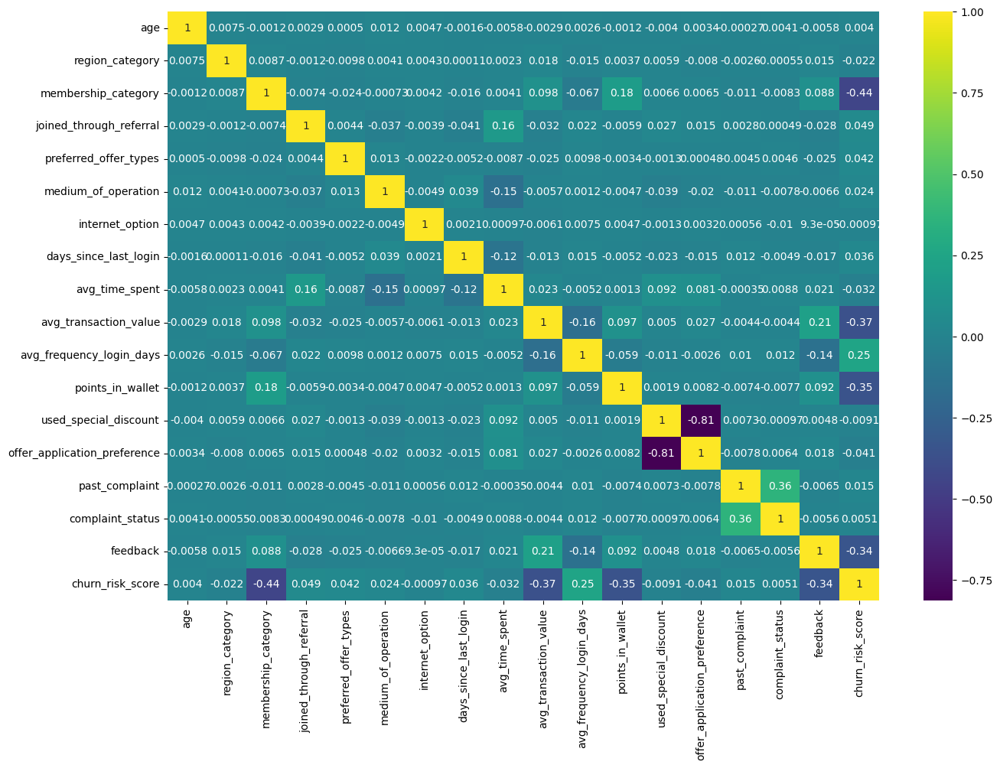

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(df1.corr(),annot = True, cmap ='viridis')

In [ ]:
ProfileReport(df1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
col = df.corr().columns
#col = col.append(pd.Index(['churn_risk_score']))
col = col.drop(['churn_risk_score'])

In [ ]:
def plot_features(df, feature_names, plot_type='distplot'):
    num_features = len(feature_names)
    grid_size = (2, 3)
    num_rows = (num_features - 1) // grid_size[1] + 1
    num_cols = min(num_features, grid_size[1])
    plt.figure(figsize=(15, 3 * num_rows))

    for i, col in enumerate(feature_names, 1):
        plt.subplot(num_rows, num_cols, i)
        if plot_type == 'boxplot':
            sns.boxplot(x=col, data=df)
        elif plot_type == 'scatter':
            sns.scatterplot(x=col, y='Target_Column', data=df)  # Chọn 'Target_Column' là cột dữ liệu cần so sánh
        else:
            sns.histplot(df[col], kde=True)  # Kết hợp histogram và đường cong KDE

        plt.title(f"{plot_type.capitalize()} of {col}", fontsize=14)
        plt.xlabel(col, fontsize=12)

    plt.tight_layout()
    plt.show()

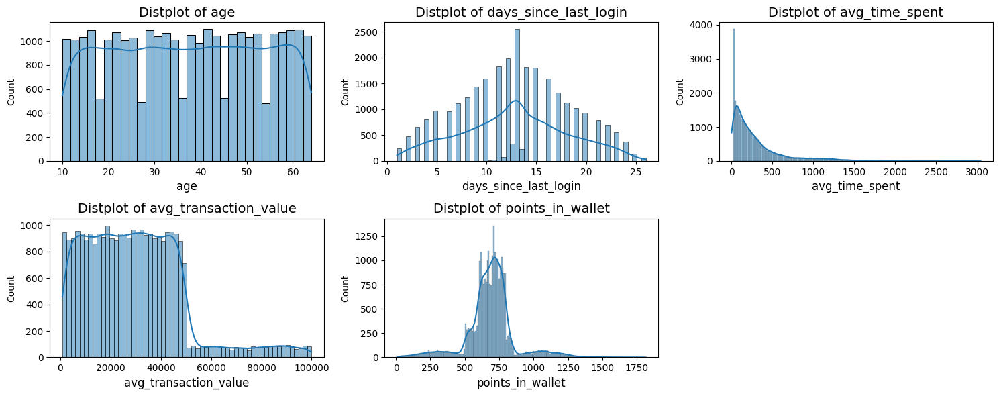

In [ ]:
plot_features(df1, col, plot_type='distplot')

Các features không tuân theo phân phối chuẩn và 1 vài feaures lệch trái

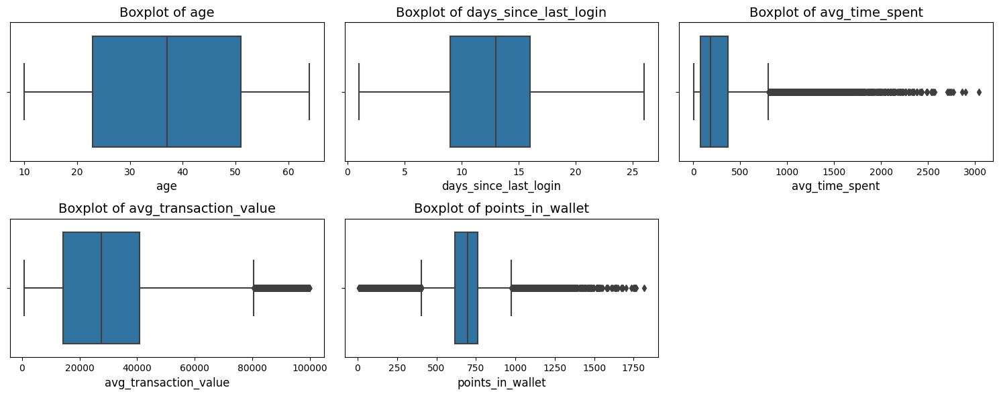

In [ ]:
plot_features(df1, col, plot_type='boxplot')

'avg_time_spent', 'avg_transaction_value', 'points_in_wallet' \
3 features có dấu hiệu outliers và cần xử lý

In [ ]:
def count_outliers(data,feature):
    df=data.copy()
    df1 = pd.DataFrame(df)
    # Sử dụng zscore từ scipy.stats để xác định outliers
    z_scores = np.abs(stats.zscore(df1[feature]))
    threshold = 3
    outliers_indices = np.where(z_scores > threshold)

    # Tạo DataFrame riêng cho outliers
    outliers_df = df1.iloc[outliers_indices]

    # Đếm số lượng outliers
    num_outliers = len(outliers_indices[0])

    # Hiển thị số lượng outliers
    print(f"Số lượng outliers: {num_outliers}")
    return num_outliers, outliers_df


In [ ]:
columns = 'avg_time_spent', 'avg_transaction_value', 'points_in_wallet'
outliers_info = []

for col1 in columns:
    a, b = count_outliers(df1, col1)
    outliers_info.append((a, b))


Số lượng outliers: 623
Số lượng outliers: 564
Số lượng outliers: 611


In [9]:
# Xác định khoảng Outliers
def find_outliers(df, feature_names):
    data = df.copy()
    for feature_name in feature_names:
        z_scores = np.abs(stats.zscore(data[feature_name]))
        threshold = 3
        data = data[(z_scores < threshold)]
    return data
# Xóa các giá trị Outliers đã được xác định
def remove_outliers(df, feature_names):
    data = df.copy()
    data = find_outliers(data, feature_names)
    return data


In [10]:
# Tạo danh sách
out_series = ['avg_time_spent', 'avg_transaction_value', 'points_in_wallet']
df2= remove_outliers(df1, out_series)
df2.shape

(34710, 18)

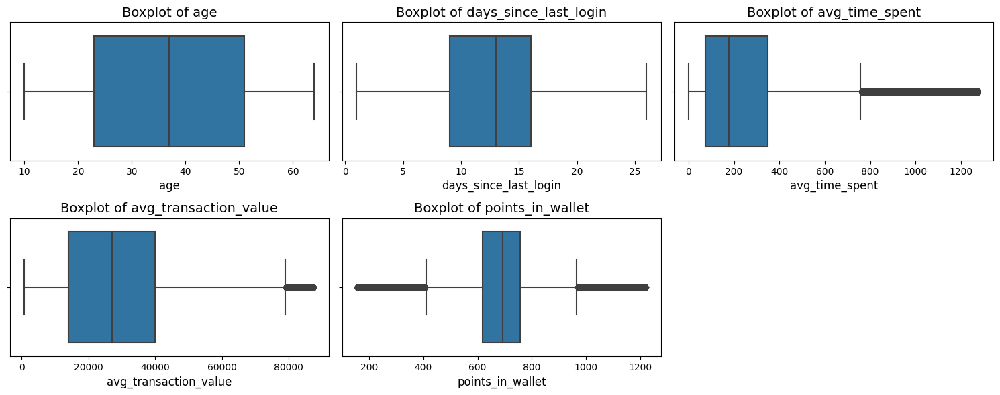

In [ ]:
plot_features(df2, col, plot_type='boxplot')

In [ ]:
df2.describe()

,age,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
count,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000
mean,37.215751,1.055465,2.222786,0.993520,0.999593,1.568943,1.010886,12.799881,265.813354,27982.745115,16.573201,686.104747,0.549134,0.548430,0.498001,2.503369,3.013811,3.640477
std,15.882909,0.997180,1.740342,0.923959,0.813369,0.858907,0.816318,5.412413,265.476475,17373.655342,7.880526,153.650929,0.497589,0.497658,0.500005,1.412507,2.549323,1.138387
min,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.840000,806.220000,0.000000,154.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,23.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,9.000000,74.087500,13958.705000,11.000000,618.000000,0.000000,0.000000,0.000000,2.000000,1.000000,3.000000
50%,37.000000,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,13.000000,179.130000,27029.795000,16.000000,693.000000,1.000000,1.000000,0.000000,2.000000,2.000000,4.000000
75%,51.000000,2.000000,4.000000,2.000000,2.000000,2.000000,2.000000,16.000000,347.795000,39944.562500,22.000000,757.000000,1.000000,1.000000,1.000000,3.000000,5.000000,5.000000
max,64.000000,3.000000,5.000000,2.000000,2.000000,3.000000,2.000000,26.000000,1277.870000,87732.220000,73.000000,1223.000000,1.000000,1.000000,1.000000,5.000000,8.000000,5.000000


# Build Model

In [11]:
def split_data(data):
    df = data.copy()
    X = df.drop(columns = 'churn_risk_score').values
    y = df['churn_risk_score'].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2023)
    return  X_train, X_test, y_train, y_test


In [12]:
X_train, X_test, y_train, y_test = split_data(df2)

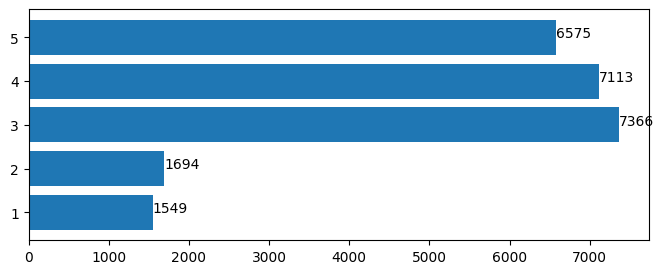

In [15]:
Co = Counter(y_train)
plt.figure(figsize=(8, 3))
plt.barh(list(Co.keys()), list(Co.values()))
for key, value in Co.items():
    plt.text(value, key, str(value))
plt.show()

Các giá trị trong tập target churn_risk_score cần được xử lý imbalance

In [16]:
from sklearn.utils import resample

def handle_imbalance(X_train, y_train):
    # Tỉ lệ undersampling cho từng nhãn
    undersample_ratios = {
        3.0: 0.7,
        4.0: 0.75,
        5.0: 0.8,
        2.0: 2,
        1.0: 2
    }

    # Chuyển đổi y_train thành mảng numpy
    y_train_np = np.array(y_train)

    # Tạo danh sách các nhãn duy nhất
    unique_labels = np.unique(y_train_np)

    # Khởi tạo danh sách lưu trữ dữ liệu sau khi xử lý mất cân bằng
    X_train_balanced = []
    y_train_balanced = []

    # Undersampling và Oversampling
    for label in unique_labels:
        # Lấy các mẫu có nhãn cụ thể
        label_samples = X_train[y_train_np == label]

        # Xác định số lượng mẫu cần undersampling hoặc oversampling
        target_count = int(len(label_samples) * undersample_ratios[label])

        if target_count < len(label_samples):
            # Undersampling
            undersampled_samples = resample(label_samples, n_samples=target_count, replace=False, random_state=42)
            X_train_balanced.extend(undersampled_samples)
            y_train_balanced.extend([label] * target_count)
        else:
            # Oversampling
            oversampled_samples = resample(label_samples, n_samples=target_count, replace=True, random_state=42)
            X_train_balanced.extend(oversampled_samples)
            y_train_balanced.extend([label] * target_count)

    # Chuyển đổi danh sách thành mảng numpy
    X_train_balanced = np.array(X_train_balanced)
    y_train_balanced = np.array(y_train_balanced)

    return X_train_balanced, y_train_balanced


In [17]:
X_train_balanced, y_train_balanced= handle_imbalance(X_train, y_train)

In [18]:

#ma trận đánh giá mô hình
def evaluate_model(y_true, y_pred):
    report = classification_report(y_true, y_pred)
    print("Classification Report\n",report)
    cm = confusion_matrix(y_true,y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.show()

# Xây dựng các mô hình Machine Learning
def Build_Model(X_train,X_test, y_train, y_test,model):
    # Xử lý imabalance với SMOTE Oversampling
    pipeline= make_imb_pipeline(
        #BorderlineSMOTE(),
        RobustScaler(),
        model
    )

    # Huấn luyện pipeline trên dữ liệu huấn luyện
    model = pipeline.fit(X_train, y_train)
    # Sử dụng mô hình để dự đoán kết quả trên tập kiểm tra
    y_pred = model.predict(X_test)
    # Sử dụng mô hình để dự đoán kết quả trên tập huấn luyện
    y_train_pred = model.predict(X_train)

    # Đánh giá mô hình trên tập kiểm tra
    print("Evaluation on the test set:")
    evaluate_model(y_test, y_pred)
    # Đánh giá mô hình trên tập huấn luyện
    print("Evaluation on the training set:")
    evaluate_model(y_train, y_train_pred)



# Logistic

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.35      0.56      0.43       640
           2       0.33      0.56      0.41       755
           3       0.67      0.57      0.62      3146
           4       0.31      0.23      0.26      3023
           5       0.48      0.54      0.51      2849

    accuracy                           0.46     10413
   macro avg       0.43      0.49      0.45     10413
weighted avg       0.47      0.46      0.46     10413



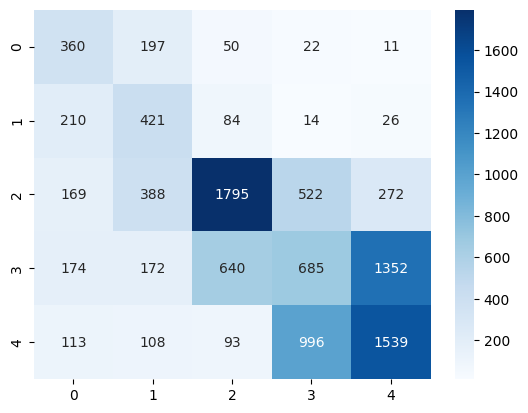

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.48      0.54      0.51      3098
           2       0.47      0.54      0.50      3388
           3       0.61      0.57      0.59      5156
           4       0.28      0.22      0.25      5334
           5       0.48      0.53      0.50      5260

    accuracy                           0.47     22236
   macro avg       0.46      0.48      0.47     22236
weighted avg       0.46      0.47      0.46     22236



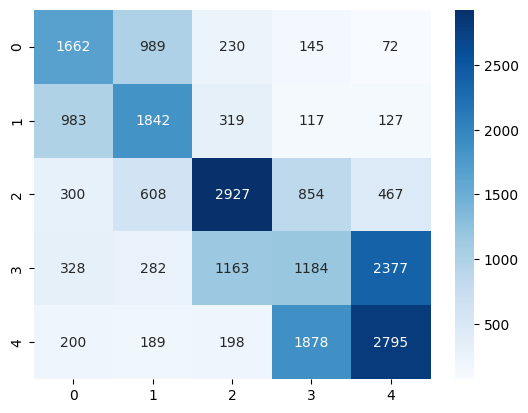

In [19]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model = LogisticRegression(class_weight="balanced"))

 Logistic mất cân bằng ở lớp 4 và các giá trị đang underfiting

# Decision Tree

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.96      0.48      0.64       640
           2       0.69      0.91      0.78       755
           3       0.86      0.92      0.89      3146
           4       0.69      0.61      0.65      3023
           5       0.71      0.76      0.73      2849

    accuracy                           0.76     10413
   macro avg       0.78      0.74      0.74     10413
weighted avg       0.76      0.76      0.75     10413



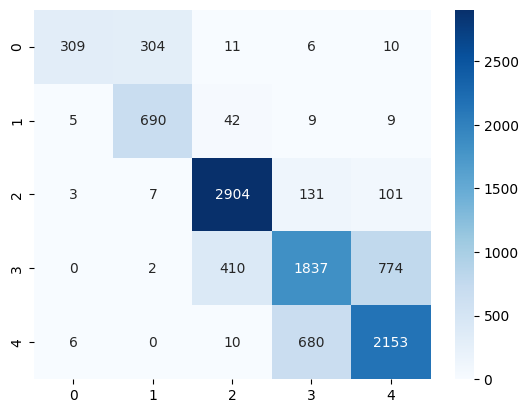

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.97      0.50      0.66      3098
           2       0.68      0.92      0.78      3388
           3       0.84      0.92      0.88      5156
           4       0.68      0.62      0.65      5334
           5       0.71      0.76      0.73      5260

    accuracy                           0.75     22236
   macro avg       0.78      0.74      0.74     22236
weighted avg       0.76      0.75      0.74     22236



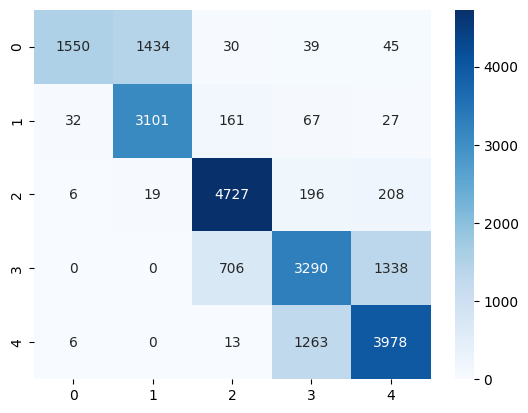

In [20]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model = DecisionTreeClassifier(max_depth=5, min_samples_split=5, random_state=42))

Decision tree ở tập train đạt kết quả không tốt so với tập test. Lớp 1 có tình trạng mất cân bằng dữ liệu

# Random Forest

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.81      0.60      0.69       640
           2       0.71      0.87      0.78       755
           3       0.86      0.93      0.89      3146
           4       0.70      0.62      0.66      3023
           5       0.73      0.75      0.74      2849

    accuracy                           0.77     10413
   macro avg       0.76      0.75      0.75     10413
weighted avg       0.76      0.77      0.76     10413



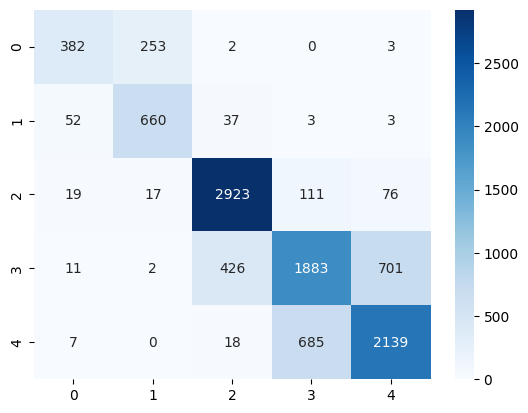

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.90      0.68      0.78      3098
           2       0.75      0.90      0.82      3388
           3       0.85      0.93      0.89      5156
           4       0.74      0.66      0.70      5334
           5       0.77      0.79      0.78      5260

    accuracy                           0.79     22236
   macro avg       0.80      0.79      0.79     22236
weighted avg       0.80      0.79      0.79     22236



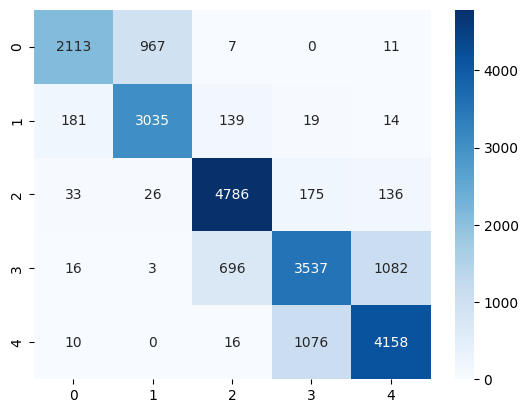

In [21]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model =  RandomForestClassifier(n_estimators=200, max_depth=7, verbose=False))

Random Forget cho kết quả khá tốt và mức độ cân bằng ổn so với giá trị dự đoán 79% . Lớp 1 và 4 dữ liệu cân bằng chưa tốt bằng các lớp khác.

# CatBoost

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.81      0.70      0.75       640
           2       0.75      0.82      0.79       755
           3       0.91      0.91      0.91      3146
           4       0.71      0.72      0.72      3023
           5       0.78      0.77      0.77      2849

    accuracy                           0.80     10413
   macro avg       0.79      0.78      0.79     10413
weighted avg       0.80      0.80      0.80     10413



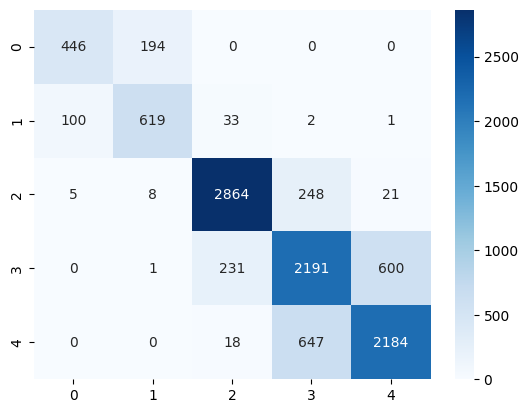

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.82      0.71      0.76      3098
           2       0.75      0.81      0.78      3388
           3       0.90      0.90      0.90      5156
           4       0.70      0.73      0.72      5334
           5       0.79      0.76      0.77      5260

    accuracy                           0.79     22236
   macro avg       0.79      0.78      0.79     22236
weighted avg       0.79      0.79      0.79     22236



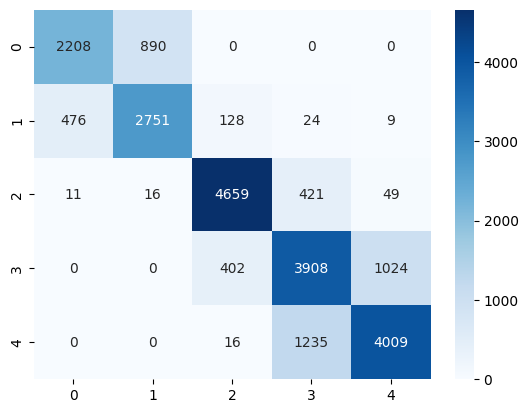

In [26]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model = CatBoostClassifier(iterations=200, depth=8, learning_rate=0.01, verbose=False))

Tình trạng imbalance ổn, dữ liệu được giữ lại tốt ở lớp 3 và accuracy thấp hơn tập test 1%

# XGBoost

[14:34:51] WARNING: ../src/learner.cc:767: 
Parameters: { "depth", "iterations", "verbose" } are not used.

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           0       0.69      0.74      0.72       640
           1       0.75      0.69      0.72       755
           2       0.91      0.92      0.92      3146
           3       0.71      0.69      0.70      3023
           4       0.76      0.77      0.76      2849

    accuracy                           0.79     10413
   macro avg       0.76      0.76      0.76     10413
weighted avg       0.79      0.79      0.79     10413



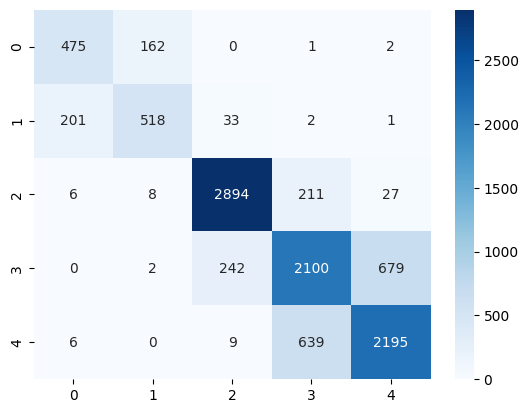

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           0       0.81      0.83      0.82      3098
           1       0.83      0.78      0.81      3388
           2       0.90      0.92      0.91      5156
           3       0.71      0.71      0.71      5334
           4       0.77      0.78      0.77      5260

    accuracy                           0.80     22236
   macro avg       0.80      0.80      0.80     22236
weighted avg       0.80      0.80      0.80     22236



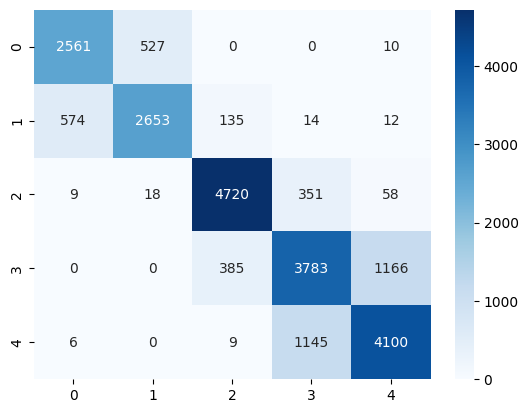

In [27]:
from xgboost import XGBClassifier
y_train_XGB = y_train_balanced - 1
y_test_XGB = y_test - 1
Build_Model(X_train_balanced,X_test, y_train_XGB, y_test_XGB,model = XGBClassifier(iterations=200, depth=8, learning_rate=0.01, verbose=False))

Imbalance giữa các lớp hợp lý so với accuracy, giá trị hợp lý giữa tập train và test

# MLP

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.64      0.76      0.69       640
           2       0.57      0.62      0.60       755
           3       0.88      0.84      0.86      3146
           4       0.73      0.62      0.67      3023
           5       0.72      0.82      0.77      2849

    accuracy                           0.75     10413
   macro avg       0.71      0.73      0.72     10413
weighted avg       0.75      0.75      0.75     10413



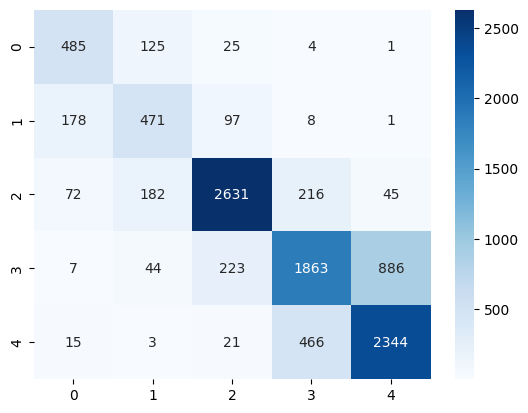

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.86      0.92      0.89      3098
           2       0.85      0.82      0.83      3388
           3       0.88      0.84      0.86      5156
           4       0.75      0.66      0.70      5334
           5       0.75      0.85      0.80      5260

    accuracy                           0.81     22236
   macro avg       0.82      0.82      0.82     22236
weighted avg       0.81      0.81      0.81     22236



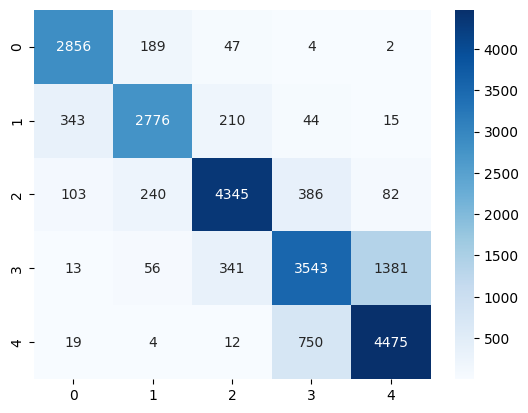

In [29]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model =  MLPClassifier( batch_size = 200, learning_rate = 'adaptive'))

Overfiting tuy không cao, kết quả không cải thiện nhiều

# SVM

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.55      0.66      0.60       640
           2       0.46      0.59      0.52       755
           3       0.76      0.76      0.76      3146
           4       0.65      0.56      0.60      3023
           5       0.66      0.68      0.67      2849

    accuracy                           0.66     10413
   macro avg       0.62      0.65      0.63     10413
weighted avg       0.67      0.66      0.66     10413



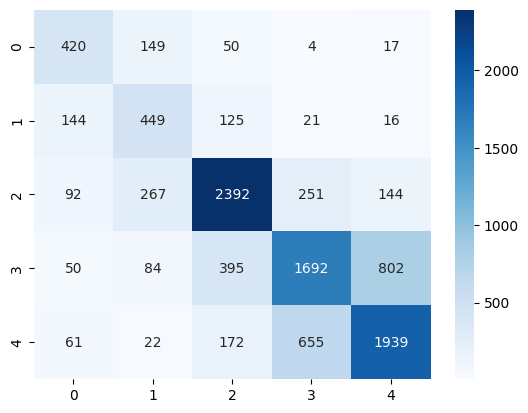

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.77      0.80      0.79      3098
           2       0.74      0.76      0.75      3388
           3       0.75      0.79      0.77      5156
           4       0.70      0.63      0.66      5334
           5       0.72      0.72      0.72      5260

    accuracy                           0.73     22236
   macro avg       0.73      0.74      0.74     22236
weighted avg       0.73      0.73      0.73     22236



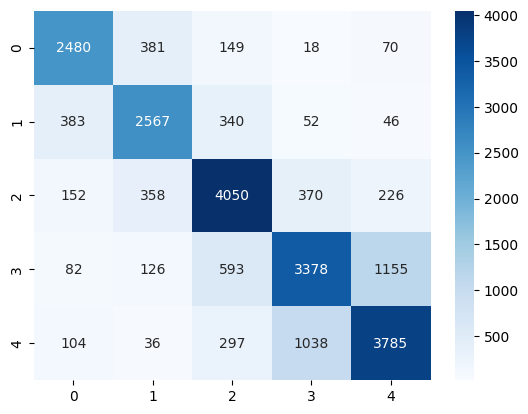

In [30]:
Build_Model(X_train_balanced,X_test, y_train_balanced, y_test,model =  SVC(kernel='rbf', random_state=1))

Tình trạng không tốt bằng các lớp khác. Vấn đề Overfiting thấp

Thử nghiệm SVM với GridSearchCV và PCA

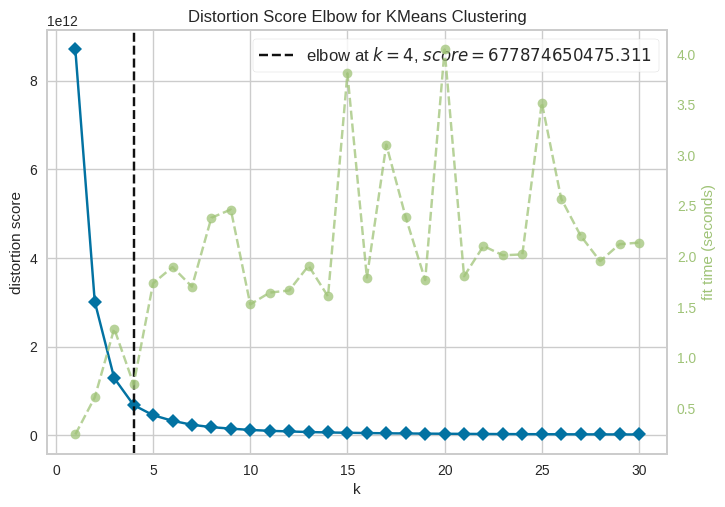

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [34]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
elbow_method = KElbowVisualizer(KMeans(), k=(1,31))
elbow_method.fit(X_train_balanced)
elbow_method.show()

Best Parameters: {'pca__n_components': 4, 'svm__C': 10, 'svm__kernel': 'rbf'}
Best Score: 0.5840431883759072
Classification Report:
              precision    recall  f1-score   support

           1       0.63      0.63      0.63      3098
           2       0.54      0.44      0.49      3388
           3       0.60      0.68      0.64      5156
           4       0.58      0.63      0.60      5334
           5       0.69      0.62      0.65      5260

    accuracy                           0.61     22236
   macro avg       0.61      0.60      0.60     22236
weighted avg       0.61      0.61      0.61     22236

              precision    recall  f1-score   support

           1       0.45      0.58      0.50       640
           2       0.33      0.37      0.35       755
           3       0.71      0.68      0.70      3146
           4       0.59      0.63      0.61      3023
           5       0.68      0.61      0.64      2849

    accuracy                           0.62     10413

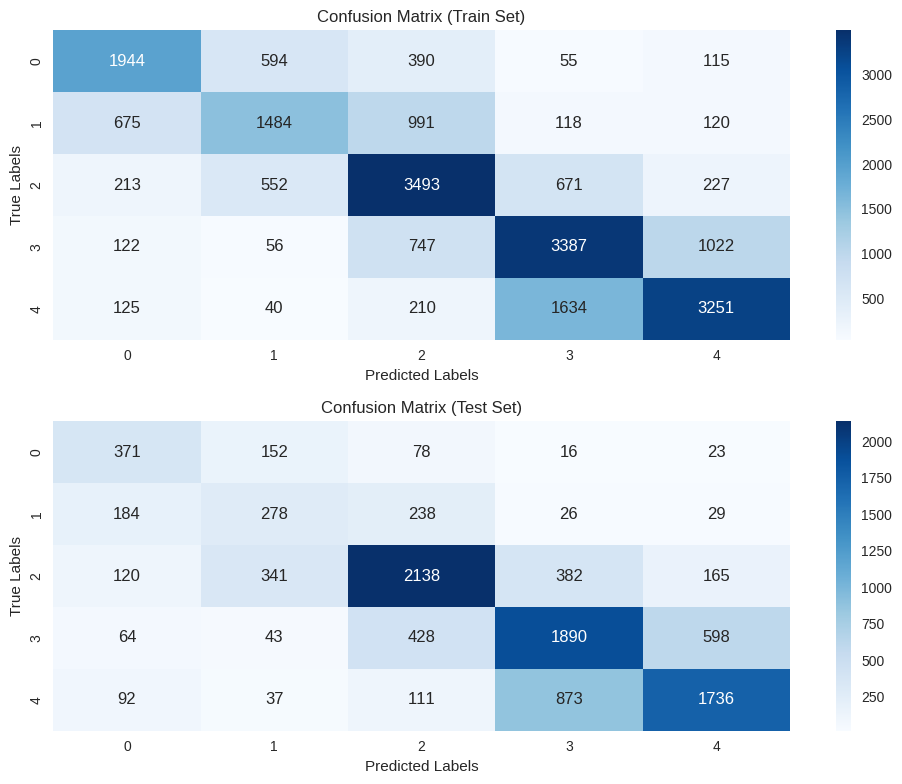

In [36]:
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
def svm_gridsearch(X_train, y_train, X_test, y_test):
    # Tạo pipeline với RobustScaler, PCA và SVC
    pipe = Pipeline([
        ('scaler', RobustScaler()),
        ('pca', PCA()),
        ('svm', SVC(random_state=1))
    ])

    # Định nghĩa các giá trị siêu tham số và khoảng tìm kiếm
    param_grid = {
        'pca__n_components': [4],
        'svm__kernel': ['rbf'],
        'svm__C': [0.1, 1, 10],
    }

    # Tạo GridSearchCV
    grid_search = GridSearchCV(pipe, param_grid, cv=5, scoring='f1_macro')

    # Huấn luyện và tìm kiếm siêu tham số tốt nhất
    grid_search.fit(X_train, y_train)

    # In kết quả tốt nhất và báo cáo
    print("Best Parameters:", grid_search.best_params_)
    print("Best Score:", grid_search.best_score_)
    print("Classification Report:")
    y_pred = grid_search.predict(X_test)
    y_train_pred = grid_search.predict(X_train)
    print(classification_report(y_train, y_train_pred))
    print(classification_report(y_test, y_pred))

        # In confusion matrix
    print("Confusion Matrix (Train Set):")
    cm_train = confusion_matrix(y_train, y_train_pred)
    print(cm_train)

    print("Confusion Matrix (Test Set):")
    cm_test = confusion_matrix(y_test, y_pred)
    print(cm_test)

    # Trực quan hóa ma trận nhầm lẫn (heatmap)
    plt.figure(figsize=(10, 8))
    plt.subplot(2, 1, 1)
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix (Train Set)')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    plt.subplot(2, 1, 2)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix (Test Set)')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    plt.tight_layout()
    plt.show()
svm_gridsearch(X_train_balanced, y_train_balanced, X_test, y_test)



Kết quả không cải thiện

In [39]:
def plot_model(models,accuracies):
    # Tạo DataFrame từ dữ liệu
    train_model = {'Models': models, 'Accuracy': accuracies}
    data = pd.DataFrame(train_model)
    sorted_models = data.sort_values(by='Accuracy', ascending=True)

    # Tạo mảng màu tùy chỉnh dựa trên số lượng
    num_colors = len(sorted_models)
    custom_palette = sns.color_palette("Blues", n_colors=num_colors)

    # Sử dụng mảng màu tùy chỉnh cho biểu đồ
    sns.barplot(y='Models', x='Accuracy', data=sorted_models, palette=custom_palette)
    plt.show()


In [37]:
# Danh sách tên các mô hình
models = ['Logistic', 'Decision Tree', 'Random Forest', 'XGBoost','CatBoost','SVM','MLP']
# Số liệu accuracy train của các mô hình
accuracies = [ 0.47, 0.76, 0.79, 0.80, 0.79,0.73,0.81]
accuracies_test = [ 0.46, 0.75, 0.77, 0.79, 0.80,0.66,0.75]


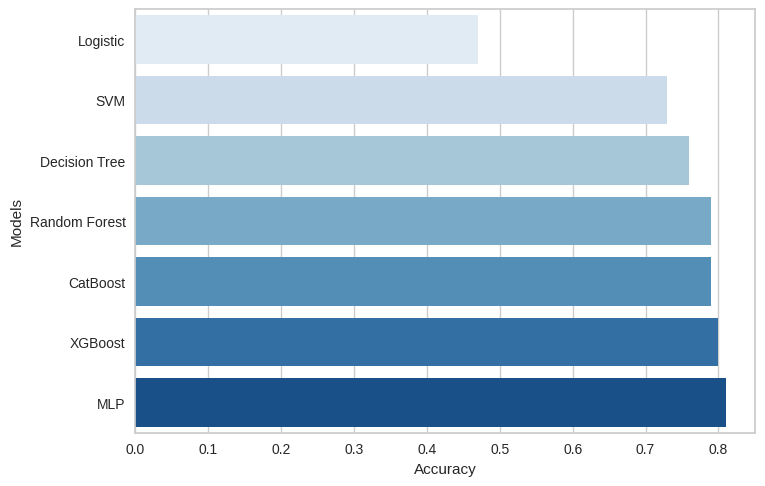

In [40]:
plot_model(models,accuracies)

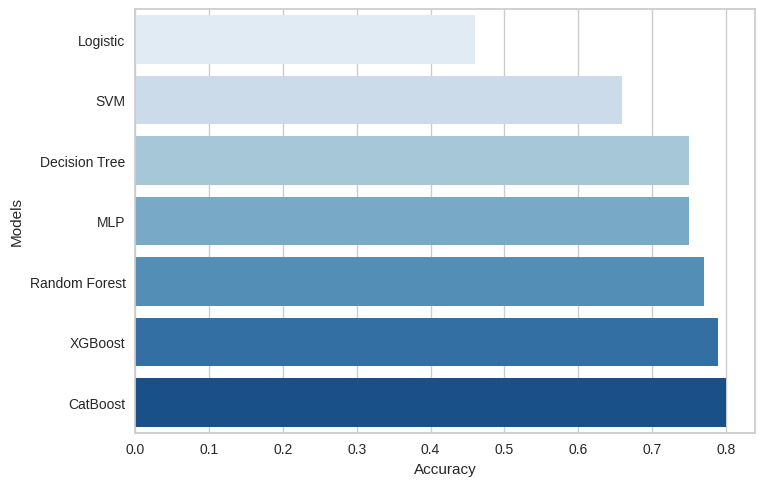

In [41]:
plot_model(models,accuracies_test)

Nhận thấy model SVM và MLP đều bị overfiting, nhưng không đáng kể
Trong khi đó, CatBoost và XGBoost đều có accuracy ở cả tập train và test khá tốt là 80%
Tình trạng imbalace đã được cải thiện. Ở 2 model tốt nhất là CatBoost và XGBoost lệch trong khoảng 10% so với các class khác


# Đánh giá

# I. Xử lý dữ liệu.
1. Xử lý dữ liệu sai định dạng: \
Xử lý các giá trị như '?','Unknown',... để chuyển đổi thành NaN. \
Xử lý kiểu dữ liệu 'str,object' về định dạng kiểu số là int, float. \
Các giá trị -1 trong churn_risk_score được xem như NaN. \
2. Xử lý dữ liệu bị rỗng. \
Xử lý NaN với kỹ thuật ước lượng bằng mô hình IterativeImputer.
3. Loại bỏ các giá trị outliers. \
Phương pháp z_score nhằm loại bỏ các giá trị liên tục.

# II. Đánh giá mô hình
1. Trong số các kỹ thuật như Smote, RandomUndersampling,resample,... xử lý imbalance data. Nhận thấy Smote cho hiệu suất tốt nhất. Thông qua recall, tuy đã cải thiện vấn đề nhưng vẫn tồn tại chênh lệch khoảng 10% so với các lớp khác. \
2. Mô hình Catboost cho kết quả accuracy tốt nhất là 80% trên cả tập train và test. Giá trị recall cũng tốt hơn các mô hình khác. \

# III. Kết luận
1. Quá trình xử lý dữ liệu đã hạn chế mất mát thông tin nhất có thể. Mặc dù chưa đạt hiệu quả cao nhất. Tuy nhiên, vẫn còn một số vấn đề cần giải quyết như cần xử lý lại dữ liệu để tối ưu hơn, hiệu suất thấp trên một số lớp, xử lý mất cân bằng trên các lớp cần được xem xét qua các tỷ lệ. \
2. Chưa thử nghiệm đánh giá và so sánh các kỹ thuật như PCA, Polynomial transform,Grid SearchCV ... cho các mô hình khác để so sánh và lựa chọn thông số thích hợp.

